<a href="https://colab.research.google.com/github/fespinozav/Depth-estimation/blob/main/va_proyecto_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Actividad: Desarrollo y Mejora de Proyectos de Visión Computacional con Técnicas Híbridas**

**Objetivo:** Desarrollar un sistema funcional que integre técnicas tradicionales de procesamiento digital de imágenes con enfoques de deep learning para abordar un problema específico de visión por computador, utilizando como base códigos de referencia disponibles en repositorios públicos (por ejemplo, GitHub). Los estudiantes deberán adaptar, optimizar y complementar dichos códigos, documentando su trabajo con fundamentos técnicos y justificaciones metodológicas.


### Proyecto: **Estimación de profundidad a partir de imágenes monoculares con técnicas híbridas de visión por computadora**

#### **Autores**:


1.   Felipe Ernesto Espinoza Vidal
2.   Lizandra Hernández Peña



# **1. Investigación y análisis del problema**

La estimación de profundidad monocular (MDE) es un desafío clave para sistemas autónomos, realidad aumentada y robótica. Obtener un mapa de profundidad preciso sin información estéreo o sensores externos permite aplicaciones más accesibles y económicas.

Este tipo de técnica también llamada percepción de profundidad a partir de una sola imagen, busca predecir, a partir de una única imagen RGB, el valor de profundidad por píxel (un mapa de profundidades). Es clave para comprender la geometría de la escena en 3D y habilita aplicaciones como conducción autónoma, robótica y AR, sin requerir hardware especializado como LiDAR o cámaras estéreo. Su dificultad proviene de que debe inferir relaciones complejas (perspectiva, sombreado, texturas) a partir de proyecciones 2D. Factores como iluminación, oclusiones y regiones con poca textura degradan el desempeño.

### Aplicaciones:
- Realidad aumentada en dispositivos móviles
- Navegación autónoma
- Reconstrucción 3D
- Robots de bajo costo
- Asistentes de movilidad

### Contexto con otras técnicas de profundidad

Frente a enfoques activos (p. ej., cámaras estéreo con proyección de patrones IR o LiDAR), la MDE se apoya en aprendizaje automático para estimar (no medir) profundidad desde una sola vista. Esto reduce dependencia de sensores específicos y abre nuevos casos de uso, aunque mantiene ambigüedades de escala y sensibilidad a condiciones de captura.

### Enfoques de aprendizaje
- Supervisado (CNN/encoder-decoder): redes convolucionales aprenden la relación implícita entre color y profundidad; es común el transfer learning con backbones tipo ResNet o variantes U-Net.
- Transformers (ViT): arquitecturas con auto-atención han mostrado mejoras >28% respecto a CNN en MDE, manteniendo el esquema encoder-decoder.
- No supervisado / auto-supervisado: entrenan con pares estéreo o secuencias de video, reconstruyendo una vista desde la otra y usando consistencia izquierda-derecha o técnicas como auto-masking y multiescala a resolución completa para mejorar la calidad. Reducen la dependencia de ground truth denso.

### Pipeline de referencia

Un flujo reproducible con TensorFlow/Keras y el conjunto DIODE (validación, ~2.6 GB)[1] :
1.	Preparación de datos (RGB + mapas de profundidad + máscaras),
2.	Preprocesamiento (recorte, log-depth, máscara),
3.	Modelo encoder-decoder con ResNet50 y 5 capas de decoder,
4.	Pérdida combinada (MSE + Huber) y métrica MAE,
5.	Entrenamiento (ej. 60 épocas, batch 32) e inferencia.

### Modelos preentrenados (SOTA práctico)

Para rendimiento y tiempos mejores, se recomienda inferir con Depth Anything V2 (variante “Small”), que reporta resultados de estado del arte en benchmarks como KITTI, y puede usarse con unas pocas líneas usando transformers pipeline.  

### Retos del problema

La MDE es inherentemente ambigua (múltiples escenas 3D pueden proyectar la misma imagen 2D). Persisten desafíos como oclusiones, regiones sin textura y la ambigüedad de escala; resolverlos requiere señales contextuales robustas y/o entrenamiento con señales de reconstrucción geométrica.

### Aplicaciones y proyección

Las aplicaciones abarcan conducción autónoma, robótica, AR y modelado 3D. La tendencia va hacia integrar MDE con tareas como detección, segmentación y entendimiento de escena para sistemas más completos, con Transformers como línea prometedora de investigación.

### Análisis del problema y primeras investigaciones
1.	Formulación: dado un input $I\in\mathbb{R}^{H\times W\times 3}$, predecir $D\in\mathbb{R}^{H\times W}$. El objetivo es minimizar el error entre D y profundidad de referencia (si existe), o pérdidas fotométricas/geométricas en esquemas auto-supervisados.
2.	Estrategia base: prototipar con el pipeline Keras + DIODE para establecer un baseline reproducible, y contrastar con Depth Anything V2 para medir la brecha entre un modelo simple y uno SOTA.
3.	Riesgos técnicos: cuidar iluminación, texturas pobres y escala; considerar datos variados y/o pérdidas geométricas para mitigar.


---
[1] “Monocular Depth Estimation: Technical Exploration”, Gaudenz Boesch, Viso.ai, 30 de octubre de 2024. (https://viso.ai/computer-vision/monocular-depth-estimation/)


# 2. Revisión de soluciones existentes

##**Repositorio 1: MiDaS - Intel ISL**

Este repositorio ofrece modelos preentrenados como DPT_Large, DPT_Hybrid y versiones de MiDaS entrenadas en múltiples datasets (KITTI, NYUv2, etc.).

**Aspectos positivos**:
- Precisión SOTA
- Buen soporte y documentación
- Generaliza bien a escenas naturales

**Aspectos negativos**:
- No produce profundidad absoluta (métrica), solo relativa
- Requiere buena GPU para inferencia rápida
- Entrenado con datasets limitados


##**Repositorio 2: PathFusion:**
PatchFusion es un framework end-to-end basado en tiles para estimación métrica de profundidad monocular en imágenes de alta resolución. El sistema utiliza una estrategia de división en parches que procesa imágenes de alta resolución dividiéndolas en patches más pequeños, procesándolos individualmente y fusionando los resultados [2].

**Modelos Base Soportados:**

*   ZoeDepth-N (Zhyever/patchfusion_zoedepth)
*   Depth-Anything-vits (Zhyever/patchfusion_depth_anything_vits14)
*   Depth-Anything-vitb (Zhyever/patchfusion_depth_anything_vitb14)
*   Depth-Anything-vitl (Zhyever/patchfusion_depth_anything_vitl14)

**Aspectos Positivos**
*   Alta Precisión Local: Al centrarse en parches, logra un refinamiento más fino en áreas complejas.

*   Robustez ante Ruido: Puede mejorar mapas de profundidad ruidosos o de baja calidad inicial.


**Aspectos negativos**
*   Restricciones específicas: las dimensiones de imagen deben ser divisibles por 2*patch_split_num
*   Requiere Múltiples Vistas: Su desempeño óptimo se logra con múltiples imágenes de la escena.
*   Alto Costo Computacional: El procesamiento por parches y la integración de redes profundas puede ser costoso en tiempo y hardware.

---
[2] "PatchFusion: An End-to-End Tile-Based Framework
 for High-Resolution Monocular Metric Depth Estimation,  Zhenyu Li, Shariq Farooq Bhat, Peter Wonka, 4 de diciembre de 2023, https://arxiv.org/pdf/2312.02284





## **Repositorio 3: Marigold:**
*   Reutilización de modelos de imágenes generativas para el análisis de visión por computadora
*   Predice las normales de la superficie a partir de imágenes RGB, estimando la orientación 3D de las superficies en cada píxel


Marigold es compatible con tres tipos principales de modelos especializados en diferentes tareas de visión por computadora:


*   MarigoldDepthPipeline: Para estimación monocular de profundidad
*   MarigoldNormalsPipeline: Para predicción de normales de superficie
*   MarigoldIIDPipeline: Para descomposición en múltiples componentes

Las ventajas de Marigold se centran en su capacidad de reutilizar conocimiento preentrenado y lograr excelente generalización con entrenamiento eficiente. Las desventajas principales están relacionadas con requisitos computacionales y complejidad operacional. El modelo representa un avance significativo en la adaptación de modelos generativos para tareas de análisis de imágenes, pero requiere recursos considerables para su implementación práctica.

##**Repositorio 4: ZoeDepth - Intel ISL**

El objetivo de este modelo es predecir profundidad métrica (en unidades reales) a partir de una sola imagen y generalizar bien fuera del dominio, combinando lo mejor de dos mundos: la robustez de los modelos de profundidad relativa (tipo MiDaS) y la escala métrica de los modelos supervisados por sensores.[3]

ZoeDepth usa un backbone estilo DPT/MiDaS y añade una cabeza de “bins métricos” (metric bins module) que aprende discretizaciones adaptativas de profundidad para producir valores en escala real. Se pre-entrena con profundidad relativa en 12 datasets y luego se ajusta con profundidad métrica en NYU Depth v2 (indoor) y KITTI (outdoor). En su variante multi-dominio (ZoeD-M12-NK), incorpora dos cabezas métricas (N para indoor, K para outdoor) y un clasificador latente que enruta automáticamente cada imagen a la cabeza adecuada en inferencia. Resultado: cero-shot sólido en múltiples dominios sin perder escala.

El repositorio en github [4] publica tres configuraciones: ZoeD_N (NYU), ZoeD_K (KITTI) y ZoeD_NK (mixta). Se cargan vía Torch Hub y devuelven mapas de profundidad en 16-bit/NumPy/Tensor. La release inicial reporta métricas (REL) en varios benchmarks y provee scripts de evaluación/entrenamiento. Nota actual: el repositorio quedó archivado (read-only) el 5 de mayo de 2025.

**Modelos/variantes oficiales**

- 	ZoeD-M12-N, ZoeD-M12-K, ZoeD-M12-NK (indoor, outdoor y mixto con ruteo de dominio). Backbone: DPT con BEiT-Large 384 (BEiT-L-384). Disponibles en Github.

**Aspectos positivos**

- Profundidad métrica real (no solo relativa), con buena generalización zero-shot entre indoor/outdoor (variante NK).
- Uso sencillo vía Torch Hub y salida en 16-bit / NumPy / Tensor lista para pipelines.

**Aspectos negativos**

- Repo archivado por Intel en may del 2025: sin mantenimiento oficial (parches/bugs/nuevas releases).
- Backbone único oficial (BEiT-L-384) menos encoders que MiDaS. Que se traduce en menos calidad y latencia según hardware.

**¿MidaS o ZoeDepth?**

En general si el objetivo es una métrica real con buena generalización, ZoeDepth es la opción. Si se prioriza robustez universal y rapidez sin requerir escala absoluta, MiDaS sigue siendo un caballo de batalla muy sólido; incluso la propia guía de MiDaS sugiere ZoeDepth cuando necesitas métrica, además posee una versión directa para PyTorch, lo que lo hace muy rápido y facil de testear.



---
[3] Bhat, S. F., Birkl, R., Wofk, D., Wonka, P., & Müller, M. (2023). Zoedepth: Zero-shot transfer by combining relative and metric depth. arXiv preprint arXiv:2302.12288
[4] https://github.com/isl-org/ZoeDepth




##**Repositorio 5: Depth-Anything-V2**

El objetivo de Depth Anything V2 (DA-V2) es servir como modelo fundacional de estimación de profundidad monocular con alta generalización zero-shot y opción de profundidad métrica mediante fine-tuning. Frente a modelos basados en Stable Diffusion, DA-V2 reporta mayor precisión, menos parámetros y >10x más velocidad de inferencia. La clave es un esquema teacher-student que sustituye el ground truth real etiquetado por 595 K imágenes sintéticas y aprovecha 62 M+ de imágenes reales no etiquetadas para pseudo-rotular y transferir capacidad al student. Posteriormente, se ajusta a profundidad métrica con etiquetas métricas específicas.

DA-V2 mantiene la arquitectura tipo DPT con ViT como encoder y un decoder ligero; en V2 se corrige la selección de características intermedias de DINOv2 para el decoding. El pipeline oficial incluye scripts para imágenes y video, Gradio demo, y soporte directo en Hugging Face Transformers (también hay puertos a Core ML, TensorRT, ONNX y Transformers.js). Por defecto, usa input size 518, y expone encoders vits/vitb/vitl/vitg. Para métrica, el repositorio provee una ruta de fine-tuning y modelos “metric-depth” pequeños y base.

DA-V2 mantiene la arquitectura tipo DPT con ViT como encoder y un decoder ligero; en V2 se corrige la selección de características intermedias de DINOv2 para el decoding. El pipeline oficial incluye scripts para imágenes y video, Gradio demo, y soporte directo en Hugging Face Transformers (también hay puertos a Core ML, TensorRT, ONNX y Transformers.js). Por defecto, usa input size 518, y expone encoders vits/vitb/vitl/vitg. Para métrica, el repositorio provee una ruta de fine-tuning y modelos “metric-depth” pequeños y base.

El repositorio en GitHub publica pesos preentrenados para profundidad relativa (Small/Base/Large; Giant “coming soon”) y detalla un snippet de uso tanto en PyTorch como vía pipeline("depth-estimation") en Transformers. Incluye además notas de licencia: Small = Apache-2.0, Base/Large/Giant = CC-BY-NC-4.0. Actualizaciones recientes muestran mantenimiento activo (p. ej., “Video Depth Anything”, “Prompt Depth Anything”, soporte en Transformers/Core ML).

**Modelos/variantes oficiales**
- Depth-Anything-V2-Small (≈ 24.8 M params), Base (≈ 97.5 M), Large (≈ 335.3 M), Giant (≈ 1.3 B, en preparación). Encoders: vits, vitb, vitl, vitg. Relative depth por defecto; metric depth disponible vía fine-tuning (modelos “small/base métricos” liberados).

**Aspectos positivos**

- Rendimiento-velocidad: más rápido y preciso que alternativas basadas en SD, con inferencias >10x más rápidas reportadas por los autores.
- Generalización robusta (zero-shot) gracias a la escala de datos (595 K sintéticas + 62 M+ reales no etiquetadas) y al esquema teacher-student.
- Ecosistema amplio: soporte oficial en Transformers, Core ML, TensorRT, ONNX y web (Transformers.js); fácil de integrar en pipelines Python y móviles.
- Opción métrica: fine-tuning a profundidad métrica con pesos publicados (Small/Base), útil para aplicaciones que requieren escala real.

**Aspectos negativos**

- Licencia mixta: solo Small es Apache-2.0; Base/Large/Giant son CC-BY-NC-4.0 (no comercial), lo que puede limitar usos empresariales.
- Giant no estable: el modelo Giant figura “coming soon”; según el README, aún no hay release consolidada.
- Métrica requiere ajuste: aunque hay pesos métricos, la mejor precisión métrica suele depender del fine-tuning por dominio/dataset y del preprocesamiento correcto (alineado a la guía del repo).

**Referencias**
- https://github.com/isl-org/ZoeDepth
- Yang, L., Kang, B., Huang, Z., Zhao, Z., Xu, X., Feng, J., & Zhao, H. (2024). Depth anything v2. Advances in Neural Information Processing Systems, 37, 21875-21911.

## **En resumen**

- MiDaS: sin escala absoluta → requiere calibración o un módulo métrico adicional.
- ZoeDepth: buen métrico zero-shot, pero sin mantenimiento oficial.
- Depth Anything V2: métrico disponible por fine-tuning y modelos “métricos” pequeños/base; para dominios específicos puede requerir ajuste adicional y respetar licencias.

# 3. Técnicas de Procesamiento digital de imágenes (PDI)

## Experimento 1
Se experimentó con un  pre/post-procesamiento ligero y justificable:
1.	Normalización fotométrica (balance de blancos, corrección gamma) para reducir variaciones de iluminación.

2.	Redimensionado y letterbox a la resolución de inferencia (p.ej., 518 px en DA-V2) para preservar aspect ratio y evitar artefactos.
3.	Realce de bordes (Laplaciano) y filtro bilateral/guided filter como post-procesado del mapa de profundidad para suavizado con preservación de contornos (mejora visual y de bordes).
4.	Máscaras morfológicas de cielo/suelo (cuando existan priors), útiles para estabilizar la escala o eliminar outliers en regiones problemáticas (cielo casi infinito).
5.	Pirámides multi-escala para refinar detalles finos tras la predicción base. (opcional)

In [ ]:
# Descargando imágenes para procesar
!gdown 1m6oHAzuhQAyxYLZcb4zku7QVLy_qNIx9
!gdown 1iPjs0G7yJuwz8Upe24CujV8It3QMWiHC

Downloading...
From: https://drive.google.com/uc?id=1m6oHAzuhQAyxYLZcb4zku7QVLy_qNIx9
To: /content/WhatsApp Image 2024-05-14 at 10.36.01.jpeg
100% 573k/573k [00:00<00:00, 50.4MB/s]
Downloading...
From: https://drive.google.com/uc?id=1iPjs0G7yJuwz8Upe24CujV8It3QMWiHC
To: /content/WhatsApp Image 2024-05-14 at 10.35.41.jpeg
100% 591k/591k [00:00<00:00, 56.5MB/s]


In [ ]:
import cv2
import numpy as np

# Leer imagen
img = cv2.imread("WhatsApp Image 2024-05-14 at 10.35.41.jpeg")

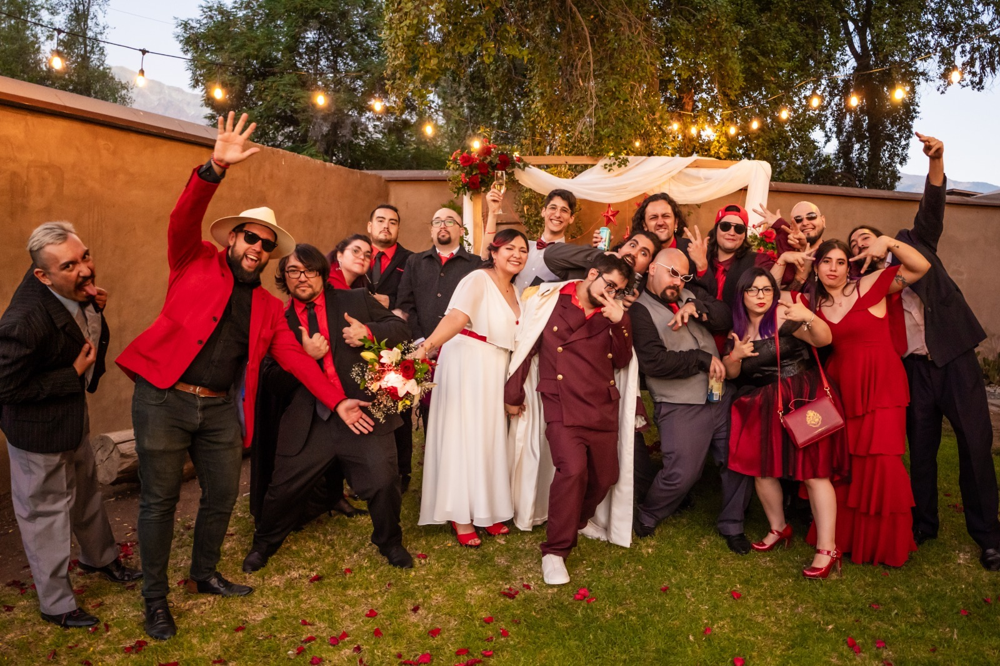

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(img)

In [ ]:
# Cambiando a dos canales
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Filtro Gaussiano para reducción de ruido
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

# Ecualización de histograma
equalized = cv2.equalizeHist(blurred)

# Detección de bordes (opcional, solo visual)
edges = cv2.Canny(equalized, 100, 200)

cv2.imwrite("preprocessed.jpg", equalized)
cv2.imwrite("edges.jpg", edges)

True

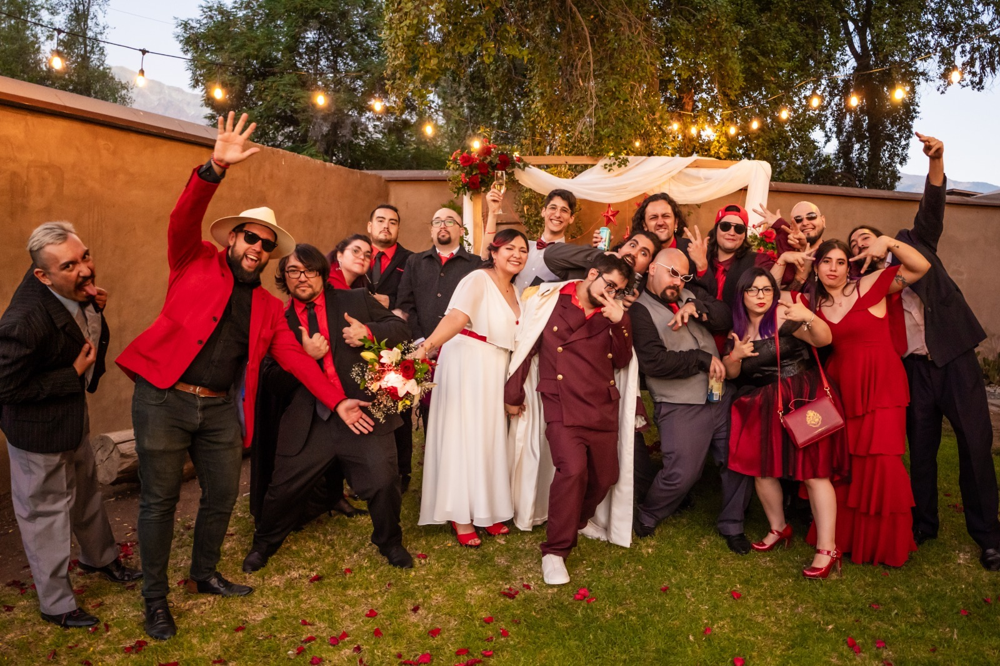

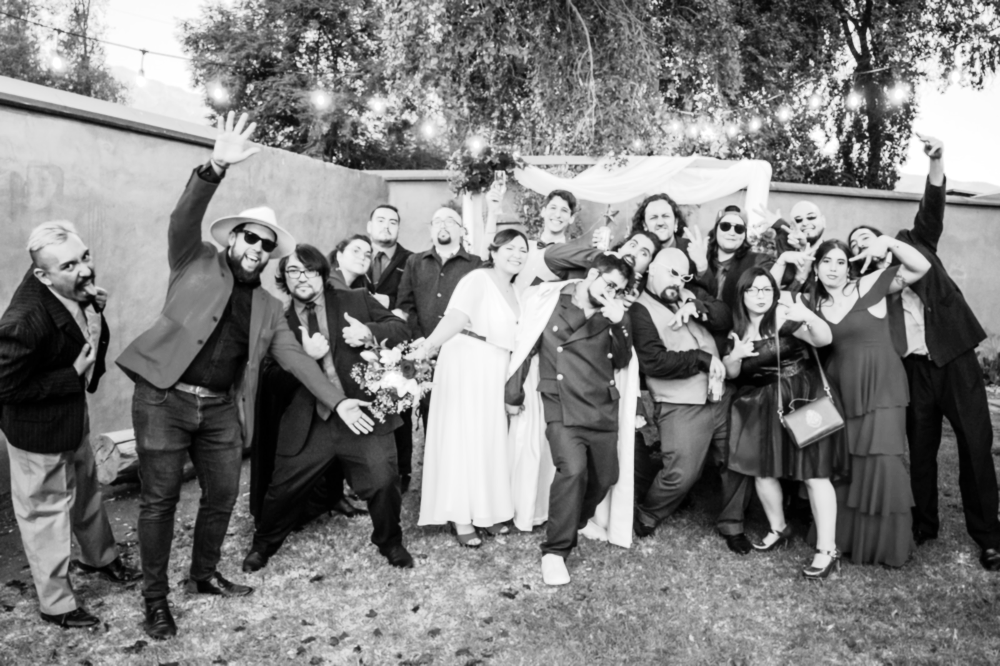

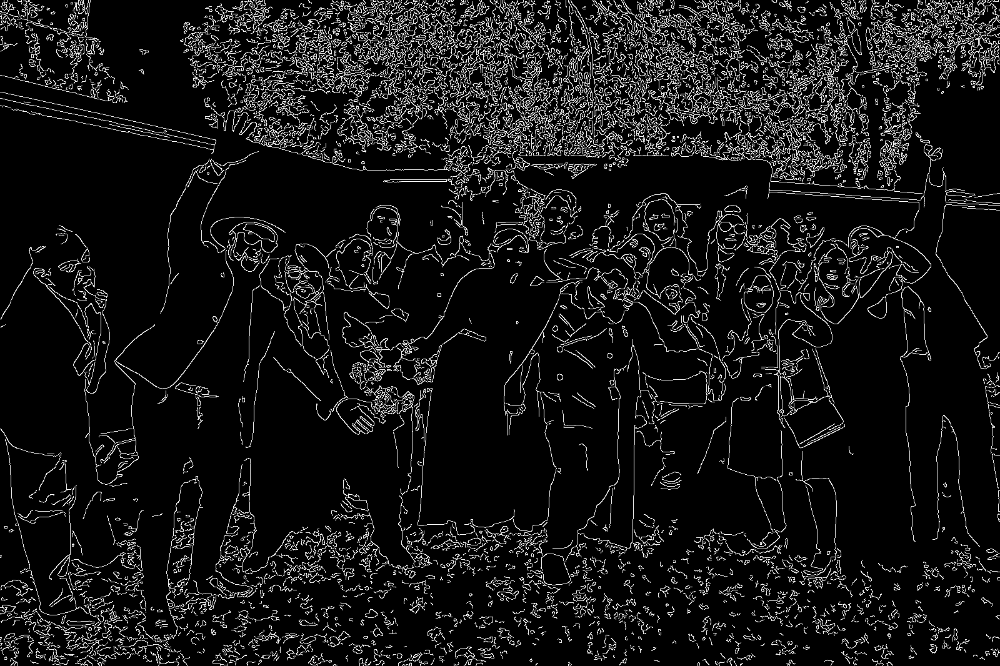

In [ ]:
# imagen original
cv2_imshow(img)

# imagen ecualizada
cv2_imshow(equalized)

# bordes de la imagen
cv2_imshow(edges)

# 4. Complementación con deep learning


## 4.1 Experimentación con modelos de de deep learning

Usando **MiDaS**.
- https://deepwiki.com/isl-org/MiDaS
- https://github.com/isl-org/MiDaS
- https://pytorch.org/hub/intelisl_midas_v2/

In [ ]:
!pip install torch torchvision opencv-python matplotlib --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 70.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 35.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.6 MB/s eta 0:00:00


In [ ]:
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt

# Configurar dispositivo
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Cargar modelo y transformaciones
model_type = "DPT_Large"  # Puedes cambiar a "DPT_Hybrid" si quieres algo más liviano
midas = torch.hub.load("intel-isl/MiDaS", model_type)
midas.to(device).eval()

midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")
transform = midas_transforms.dpt_transform

/usr/local/lib/python3.11/dist-packages/torch/hub.py:330: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/intel-isl/MiDaS/zipball/master" to /root/.cache/torch/hub/master.zip
/usr/local/lib/python3.11/dist-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.l

In [ ]:
# Cargar imagen y preprocesamiento clásico
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Opción: filtrar y ecualizar
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
equalized = cv2.equalizeHist(blurred)

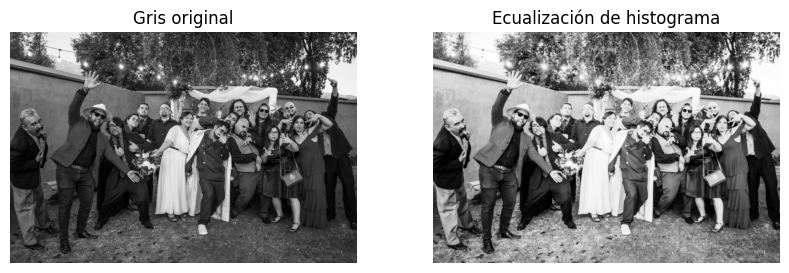

In [ ]:
# Mostrar ecualizada
plt.figure(figsize=(10,3))
plt.subplot(1,2,1)
plt.imshow(gray, cmap='gray')
plt.title("Gris original")
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(equalized, cmap='gray')
plt.title("Ecualización de histograma")
plt.axis('off')
plt.show()

In [ ]:
# Transformación para MiDaS
input_batch = transform(img_rgb).to(device)

# Inferencia
with torch.no_grad():
    prediction = midas(input_batch)
    prediction = torch.nn.functional.interpolate(
        prediction.unsqueeze(1),
        size=img.shape[:2],
        mode="bicubic",
        align_corners=False,
    ).squeeze()

# Normalizar profundidad
depth_map = prediction.cpu().numpy()
depth_map = (depth_map - depth_map.min()) / (depth_map.max() - depth_map.min())

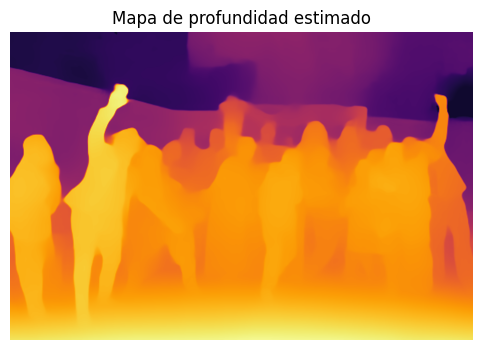

In [ ]:
# Mostrar mapa de profundidad
plt.figure(figsize=(8,4))
plt.imshow(depth_map, cmap='inferno')
plt.title("Mapa de profundidad estimado")
plt.axis("off")
plt.show()

## 4.2 Experimentación con modelos de deep learning

Usando **PathFusion**
*   https://deepwiki.com/zhyever/PatchFusion
*  https://github.com/zhyever/PatchFusion

In [ ]:
#  Configuración inicial
!git clone https://github.com/zhyever/PatchFusion.git
%cd PatchFusion

fatal: destination path 'PatchFusion' already exists and is not an empty directory.
/content/PatchFusion


In [ ]:
# Instalar NumPy
!pip uninstall numpy -y
# Usar NumPy 1.26.0
!pip install numpy==1.26.0

Found existing installation: numpy 2.0.2
Uninstalling numpy-2.0.2:
  Successfully uninstalled numpy-2.0.2
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 108.0 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.0 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.0 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.0 which is incompatible.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.0 which is incompatible.


In [ ]:
# Verificar NumPy
import numpy as np
print(f"NumPy version: {np.__version__}")

NumPy version: 1.26.0


In [ ]:
# Desinstalar e instalar PyTorch con versiones específicas
!pip uninstall torch torchvision torchaudio -y
!pip install torch==2.1.2 torchvision==0.16.2 torchaudio==2.1.2 --index-url https://download.pytorch.org/whl/cu118

Found existing installation: torch 2.6.0+cu124
Uninstalling torch-2.6.0+cu124:
  Successfully uninstalled torch-2.6.0+cu124
Found existing installation: torchvision 0.21.0+cu124
Uninstalling torchvision-0.21.0+cu124:
  Successfully uninstalled torchvision-0.21.0+cu124
Found existing installation: torchaudio 2.6.0+cu124
Uninstalling torchaudio-2.6.0+cu124:
  Successfully uninstalled torchaudio-2.6.0+cu124
Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 GB 967.3 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.1/6.1 MB 100.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 97.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 MB 8.6 MB/s eta 0:00:00
  Attempting uninstall: triton
    Found existing installation: triton 3.2.0
    Uninstalling triton-3.2.0:
      Successfully uninstalled triton-3.2.0


In [ ]:
# Verificar PyTorch
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

PyTorch version: 2.1.2+cu118
CUDA available: True


In [ ]:
# Instalar dependencias
!pip install opencv-python==4.8.1.78
!pip install huggingface-hub==0.20.1
!pip install timm==0.9.2
!pip install mmengine==0.10.2
!pip install kornia==0.7.2
!pip install einops
!pip install matplotlib
!pip install transformers torchmetrics --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.7/61.7 MB 12.2 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.12.0.88
    Uninstalling opencv-python-4.12.0.88:
      Successfully uninstalled opencv-python-4.12.0.88
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 330.1/330.1 kB 11.8 MB/s eta 0:00:00
  Attempting uninstall: huggingface-hub
    Found existing installation: huggingface-hub 0.34.3
    Uninstalling huggingface-hub-0.34.3:
      Successfully uninstalled huggingface-hub-0.34.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datasets 4.0.0 requires huggingface-hub>=0.24.0, but you have huggingface-hub 0.20.1 which is incompatible.
diffusers 0.34.0 requires huggingface-hub>=0.27.0, but you have huggingface-hub 0.20.1 which is incompatible.
transformers 4.54.1 requires huggingface-hub<1.0,>=0.34.0, but y

In [ ]:
# Configurar variables de entorno
import os
import sys

colab_path = "/content/PatchFusion"
sys.path.append(colab_path)
sys.path.append(f"{colab_path}/external")
os.environ['PYTHONPATH'] = f"{colab_path}:{colab_path}/external"

In [ ]:
# PASO 4: Subir imágenes
!mkdir -p examples

from google.colab import files
print("Selecciona las imágenes que quieres procesar:")
uploaded = files.upload()

import shutil
for filename in uploaded.keys():
    shutil.move(filename, f'examples/{filename}')
    print(f"Imagen {filename} subida correctamente")

Selecciona las imágenes que quieres procesar:


Saving 20220205_175455.jpg to 20220205_175455.jpg
Imagen 20220205_175455.jpg subida correctamente


In [ ]:
# Ejecutar inferencia
# Importar librerías una por una
try:
    import cv2
    print("✓ OpenCV importado correctamente")
except Exception as e:
    print(f"✗ Error con OpenCV: {e}")

try:
    import torch
    import torch.nn.functional as F
    print("✓ PyTorch importado correctamente")
except Exception as e:
    print(f"✗ Error con PyTorch: {e}")

try:
    from torchvision import transforms
    print("✓ Torchvision importado correctamente")
except Exception as e:
    print(f"✗ Error con Torchvision: {e}")

try:
    from estimator.models.patchfusion import PatchFusion
    print("✓ PatchFusion importado correctamente")
except Exception as e:
    print(f"✗ Error con PatchFusion: {e}")


✓ OpenCV importado correctamente
✓ PyTorch importado correctamente
✓ Torchvision importado correctamente
✓ PatchFusion importado correctamente


In [ ]:
# Configurar dispositivo
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Usando dispositivo: {DEVICE}")

# Cargar modelo
model_name = 'Zhyever/patchfusion_depth_anything_vitl14'
print("Cargando modelo desde HuggingFace...")
model = PatchFusion.from_pretrained(model_name).to(DEVICE).eval()
print("Modelo cargado exitosamente")

# Configuración optimizada
image_raw_shape = [1080, 1920]
image_resizer = model.resizer

tile_cfg = dict()
tile_cfg['image_raw_shape'] = image_raw_shape
tile_cfg['patch_split_num'] = [2, 2]

Usando dispositivo: cuda
Cargando modelo desde HuggingFace...


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


pytorch_model.bin:   0%|          | 0.00/3.06G [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


Modelo cargado exitosamente



Procesando imagen: 20220205_175455.jpg


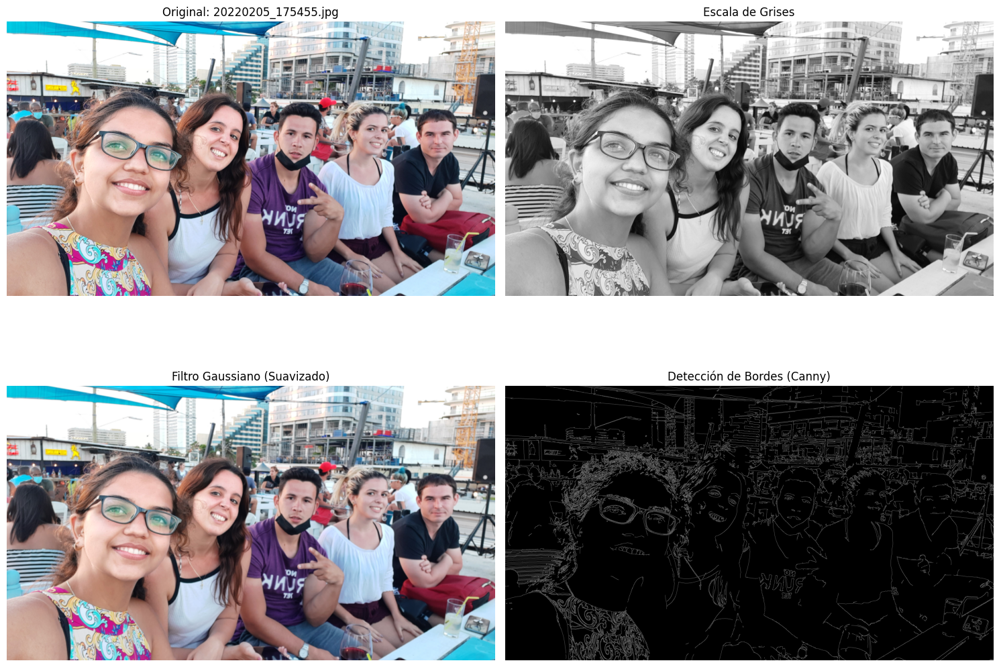

Versiones procesadas guardadas para 20220205_175455.jpg


In [ ]:
# PROCESAMIENTO BÁSICO
import cv2
from scipy import ndimage
import matplotlib.pyplot as plt

for filename in uploaded.keys():
    print(f"\nProcesando imagen: {filename}")

    # Cargar imagen original
    image_path = f'./examples/{filename}'
    image_bgr = cv2.imread(image_path)

    if image_bgr is None:
        print(f"Error: No se pudo cargar la imagen {filename}")
        continue

    # Convertir a RGB para matplotlib
    image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

    # 1. Escala de grises
    image_gray = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

    # 2. Filtro gaussiano (suavizado)
    # Aplicar filtro gaussiano con kernel 15x15 y sigma=2
    image_gaussian = cv2.GaussianBlur(image_rgb, (15, 15), 2)

    # 3. Detección de bordes usando Canny
    # Primero convertir a escala de grises para Canny
    edges = cv2.Canny(image_gray, threshold1=50, threshold2=150)

    # Visualizar los tres procesamientos
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))

    # Imagen original
    axes[0, 0].imshow(image_rgb)
    axes[0, 0].set_title(f'Original: {filename}')
    axes[0, 0].axis('off')

    # Escala de grises
    axes[0, 1].imshow(image_gray, cmap='gray')
    axes[0, 1].set_title('Escala de Grises')
    axes[0, 1].axis('off')

    # Filtro gaussiano
    axes[1, 0].imshow(image_gaussian)
    axes[1, 0].set_title('Filtro Gaussiano (Suavizado)')
    axes[1, 0].axis('off')

    # Detección de bordes
    axes[1, 1].imshow(edges, cmap='gray')
    axes[1, 1].set_title('Detección de Bordes (Canny)')
    axes[1, 1].axis('off')

    plt.tight_layout()
    plt.show()

    # Guardar las versiones procesadas
    cv2.imwrite(f'gray_{filename}', image_gray)
    cv2.imwrite(f'gaussian_{filename}', cv2.cvtColor(image_gaussian, cv2.COLOR_RGB2BGR))
    cv2.imwrite(f'edges_{filename}', edges)

    print(f"Versiones procesadas guardadas para {filename}")


Procesando imagen: 20220205_175455.jpg
Ejecutando inferencia...


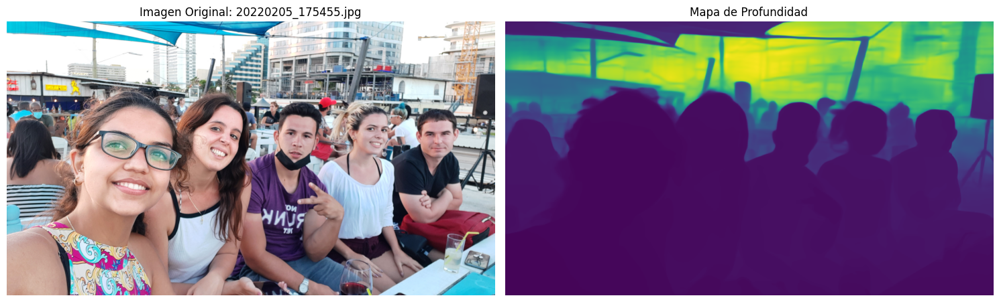

Resultado guardado como: depth_20220205_175455.png

¡Procesamiento completado!


In [ ]:
# Procesar imágenes
import matplotlib.pyplot as plt

for filename in uploaded.keys():
    print(f"\nProcesando imagen: {filename}")

    image_path = f'./examples/{filename}'
    image = cv2.imread(image_path)

    if image is None:
        print(f"Error: No se pudo cargar la imagen {filename}")
        continue

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) / 255.0
    image = transforms.ToTensor()(np.asarray(image)) #convierte la imagen de NumPy array a tensor de PyTorch

    image_lr = image_resizer(image.unsqueeze(dim=0)).float().to(DEVICE) #redimensiona la imagen a la resolución de procesamiento del modelo base
    image_hr = F.interpolate(image.unsqueeze(dim=0), image_raw_shape, mode='bicubic', align_corners=True).float().to(DEVICE)

    print("Ejecutando inferencia...")
    depth_prediction, _ = model(
        mode='infer',
        cai_mode='r32',
        process_num=2,
        image_lr=image_lr,
        image_hr=image_hr,
        tile_cfg=tile_cfg
    )
    depth_prediction = F.interpolate(depth_prediction, image.shape[-2:])[0, 0].detach().cpu().numpy()
   # Visualizar resultados
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

    ax1.imshow(image.permute(1, 2, 0))
    ax1.set_title(f'Imagen Original: {filename}')
    ax1.axis('off')

    depth_colored = plt.cm.viridis(depth_prediction / depth_prediction.max())
    ax2.imshow(depth_colored)
    ax2.set_title('Mapa de Profundidad')
    ax2.axis('off')

    plt.tight_layout()
    plt.show()

    result_filename = f'depth_{filename.split(".")[0]}.png'
    plt.imsave(result_filename, depth_colored)
    print(f"Resultado guardado como: {result_filename}")

print("\n¡Procesamiento completado!")

## 4.3 Experimentación con modelos de deep learning

Usando **Marigold**
*  https://deepwiki.com/prs-eth/Marigold
*  https://github.com/prs-eth/Marigold

In [ ]:
 # Clonar el repositorio
!git clone https://github.com/prs-eth/Marigold.git
%cd Marigold

# Instalar dependencias
!pip install -r requirements.txt

Cloning into 'Marigold'...
remote: Enumerating objects: 913, done.
remote: Counting objects: 100% (359/359), done.
remote: Compressing objects: 100% (145/145), done.
remote: Total 913 (delta 292), reused 214 (delta 214), pack-reused 554 (from 2)
Receiving objects: 100% (913/913), 9.69 MiB | 22.05 MiB/s, done.
Resolving deltas: 100% (503/503), done.
/content/Marigold/Marigold


Selecciona las imágenes desde tu ordenador:


Saving Luka.jpg to Luka.jpg
✅ Se subieron 1 imágenes
📸 IMÁGENES ORIGINALES (1 encontradas):


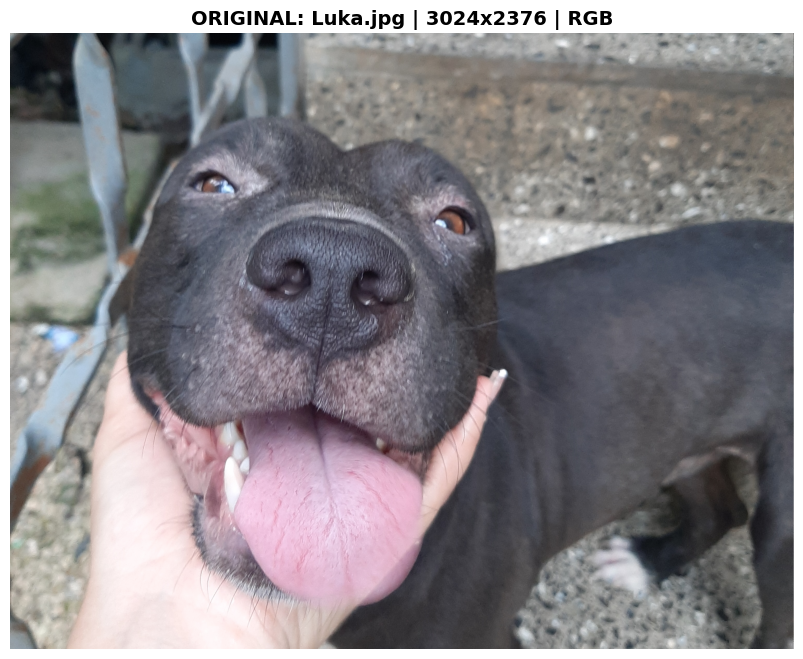


🔄 PROCESANDO IMÁGENES...
2025-07-31 23:13:53.299369: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754003633.320939   12446 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754003633.327551   12446 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-31 23:13:53.351711: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
The config attributes {'prediction_type': 'depth'} were passed to MarigoldDepthPipeline, bu

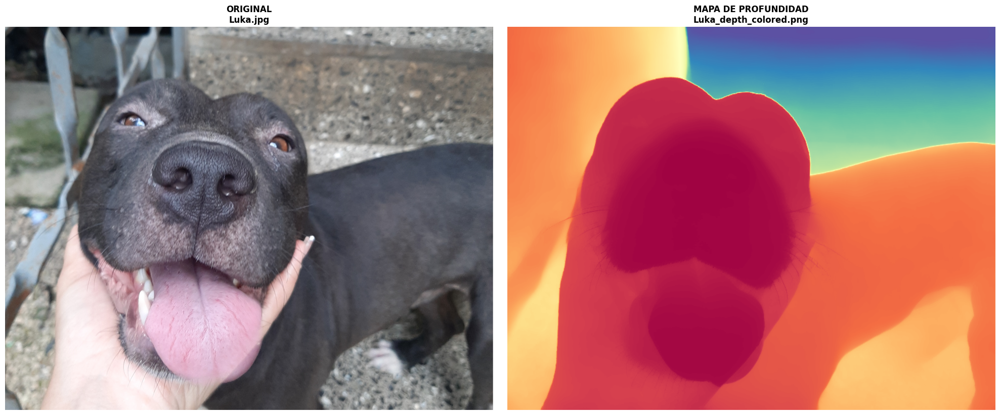

In [ ]:
from google.colab import files
import os
import shutil
import matplotlib.pyplot as plt
from PIL import Image
from glob import glob

# 1. Subir imágenes
os.makedirs('input/mis_imagenes', exist_ok=True)

print("Selecciona las imágenes desde tu ordenador:")
uploaded = files.upload()

# Mover archivos
for filename in uploaded.keys():
    shutil.move(filename, f'input/mis_imagenes/{filename}')

print(f" Se subieron {len(uploaded)} imágenes")

# 2. MOSTRAR IMÁGENES ORIGINALES
def mostrar_imagenes_originales(input_dir, max_images=5):
    extensions = [".jpg", ".jpeg", ".png"]
    image_files = []

    for ext in extensions:
        image_files.extend(glob(os.path.join(input_dir, f"*{ext}")))
        image_files.extend(glob(os.path.join(input_dir, f"*{ext.upper()}")))

    image_files = sorted(image_files)

    print(f" IMÁGENES ORIGINALES ({len(image_files)} encontradas):")
    print("=" * 60)

    for i, img_path in enumerate(image_files[:max_images]):
        img = Image.open(img_path)
        filename = os.path.basename(img_path)

        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        plt.title(f'ORIGINAL: {filename} | {img.size[0]}x{img.size[1]} | {img.mode}',
                 fontsize=14, fontweight='bold')
        plt.axis('off')
        plt.show()

# Mostrar imágenes originales
mostrar_imagenes_originales('input/mis_imagenes')

# 3. Ejecutar procesamiento
print("\n PROCESANDO IMÁGENES...")
!python script/depth/run.py \
    --checkpoint prs-eth/marigold-depth-v1-1 \
    --input_rgb_dir input/mis_imagenes \
    --output_dir output/mis_resultados \
    --fp16

# 4. Mostrar comparación
def comparar_original_vs_procesada(input_dir, output_dir, max_images=3):
    # Buscar imágenes originales
    extensions = [".jpg", ".jpeg", ".png"]
    original_files = []

    for ext in extensions:
        original_files.extend(glob(os.path.join(input_dir, f"*{ext}")))
        original_files.extend(glob(os.path.join(input_dir, f"*{ext.upper()}")))

    original_files = sorted(original_files)

    print(f"\n COMPARACIÓN ORIGINAL vs PROCESADA:")
    print("=" * 60)

    for i, orig_path in enumerate(original_files[:max_images]):
        orig_img = Image.open(orig_path)
        orig_filename = os.path.basename(orig_path)

        # Buscar imagen procesada correspondiente
        base_name = os.path.splitext(orig_filename)[0]
        depth_colored_path = os.path.join(output_dir, "depth_colored", f"{base_name}_depth_colored.png")

        if os.path.exists(depth_colored_path):
            depth_img = Image.open(depth_colored_path)

            # Mostrar lado a lado
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

            ax1.imshow(orig_img)
            ax1.set_title(f'ORIGINAL\n{orig_filename}', fontsize=12, fontweight='bold')
            ax1.axis('off')

            ax2.imshow(depth_img)
            ax2.set_title(f'MAPA DE PROFUNDIDAD\n{base_name}_depth_colored.png', fontsize=12, fontweight='bold')
            ax2.axis('off')

            plt.tight_layout()
            plt.show()
        else:
            print(f" No se encontró resultado para {orig_filename}")

# Comparar resultados
comparar_original_vs_procesada('input/mis_imagenes', 'output/mis_resultados')

## 5. Adaptación de código

El proyecto alojado en el repositorio de github [Depth-estimation](https://github.com/fespinozav/Depth-estimation) implementa un sistema de estimación de profundidad monocular en tiempo real y por lotes de imágenes, basado en MiDaS (Intel-ISL). Está diseñado como una aplicación parametrizable por CLI y adaptable a distintos entornos de captura y hardware.

**Entradas**: Webcam, archivo de video o carpeta de imágenes.
**Dispositivo**: Selección automática o forzada entre CUDA/MPS/CPU con opción de FP16 en CUDA para acelerar la inferencia.
**Modelos disponibles**: MiDaS DPT_Large, MiDas DPT_Hybrid o MiDaS_small, aplicando la transformación adecuada a cada variante.

**Pipeline**:
1.  Lectura y encuadre al tamaño objetivo
2.  Inferencia con MiDaS
3.  Re-escalado del mapa a la resolución original
4.  normalización por percentiles (p2-p98) para reducir parpadeo
5.  Post-procesado con técnicas de procesamiento digital de imágenes opcional con filtro bilateral que suaviza y preserva
7.  Filtro digital de paso bajo en tiempo, el cual suaviza mapas de profundidad y reduce el efecto "flicker" de parpadeo mediante un modelo matemático temporal por pixel cuando la fuente es como en este caso un video o webcam.

**Visualización**: muestra lado a lado (RGB | profundidad con colormap MAGMA) y overlay de FPS.

![Visualización](https://github.com/fespinozav/Depth-estimation/blob/main/informe/img1.png?raw=true)

**Salidas/outputs**:

- profundidad cruda (.npy float32),
- PNG 16-bit normalizado (apto para análisis cuantitativo),
- PNG coloreado para informes,
- y video MP4 con la vista combinada (en modo video).

**Trazabilidad**: registra en log.csv parámetros de ejecución (modelo, dispositivo, tamaño, flags) y FPS por cuadro.

**Usabilidad**: atajos q/x/ESC para salir y manejo del cierre por botón “X” de la ventana; soporta backends de captura avfoundation/dshow/v4l2.

---

**Referencias:**

- https://pytorch.org/hub/intelisl_midas_v2/
- https://visionbook.mit.edu/temporal_filters_v2.html
- https://visionbook.mit.edu/3d_learning.html
- Hoffman DM, Karasev VI, Banks MS. Temporal presentation protocols in stereoscopic displays: Flicker visibility, perceived motion, and perceived depth. J Soc Inf Disp. 2011 Mar 1;19(3):271-297. doi: 10.1889/JSID19.3.271. PMID: 21572544; PMCID: PMC3092720.


### 5.1 **Pseudo código**


In [ ]:
# -----------------------------
# 3.b Fuentes de entrada y procesamiento de imágenes
# -----------------------------
def process_webcam(args, midas, transform, device):
    # Backend opcional (macOS: avfoundation suele ser más estable)
    backend = backend_flag(args.backend)
    cap = cv.VideoCapture(args.cam_index if args.cam_index is not None else 0,
                          backend if backend is not None else 0)
    cap.set(cv.CAP_PROP_FRAME_WIDTH, args.cam_width)
    cap.set(cv.CAP_PROP_FRAME_HEIGHT, args.cam_height)

    if not cap.isOpened():
        raise RuntimeError("No se pudo abrir la webcam.")

    out_dir = get_output_dir(args)
    ensure_dir(out_dir)
    csv_file, writer = write_csv_header(out_dir / "log.csv")

    ema = None
    writer_video = None
    out_path_webcam = str(out_dir / "webcam_depth_colored.mp4")
    try:
        t_prev = time.perf_counter()
        idx = 0
        while True:
            ok, frame = cap.read()
            if not ok:
                print("Frame perdido; intentando continuar…")
                continue

            t0 = time.perf_counter()
            depth = run_inference(frame, midas, transform, device, args.size, args.fp16)
            # -----------------------------
            # 4.  Normalización por percentiles
            # -----------------------------
            depth_norm = percentile_normalize(depth, args.p_low, args.p_high)
            depth_u8 = (depth_norm * 255).astype(np.uint8)
            depth_u8 = apply_postprocess(depth_u8, args.bilateral)

            # -----------------------------
            # 5.  Suavizado temporal (EMA)
            # -----------------------------
            if args.ema_alpha is not None:
                if ema is None:
                    ema = depth_u8.copy()
                else:
                    a = float(args.ema_alpha)
                    ema = (a * ema + (1.0 - a) * depth_u8).astype(np.uint8)
                vis_u8 = ema
            else:
                vis_u8 = depth_u8

            depth_color = colorize(vis_u8)

            # Mostrar lado a lado
            viz = cv.hconcat([frame, depth_color])

            # Inicializa grabación MP4 en el primer frame si se solicitó
            if args.record_webcam and writer_video is None:
                fourcc = cv.VideoWriter_fourcc(*"mp4v")
                writer_video = cv.VideoWriter(out_path_webcam, fourcc, args.webcam_fps, (viz.shape[1], viz.shape[0]))
                if not writer_video.isOpened():
                    print(f"[WARN] No se pudo abrir el VideoWriter para {out_path_webcam}")
                else:
                    print(f"[INFO] Grabando webcam a {out_path_webcam} @ {args.webcam_fps} FPS")

            # Si está activo, escribir frame al MP4
            if writer_video is not None:
                writer_video.write(viz)

            # FPS
            t1 = time.perf_counter()
            fps = 1.0 / max(t1 - t_prev, 1e-6)
            t_prev = t1

            cv.putText(
                viz,
                f"{args.model} | {device.type.upper()} | {fps:5.1f} FPS",
                (10, 25),
                cv.FONT_HERSHEY_SIMPLEX,
                0.7,
                (255, 255, 255),
                2,
            )

            if not args.no_display:
                cv.imshow("MiDaS Depth (webcam)", viz)
                # Cerrar si el usuario presiona el botón 'X' de la ventana
                if window_should_close("MiDaS Depth (webcam)"):
                    break

            # Guardado por frame (opcional)
            if args.save_every_n > 0 and (idx % args.save_every_n == 0):
                base = f"webcam_{idx:06d}"
                save_artifacts(depth, depth_u8, depth_color, out_dir, base, args)

            # Log CSV
            writer.writerow([
                time.strftime("%Y-%m-%d %H:%M:%S"),
                "webcam",
                idx,
                "",
                args.model,
                device.type,
                args.size,
                int(args.fp16 and device.type == "cuda"),
                int(args.bilateral),
                frame.shape[1],
                frame.shape[0],
                f"{fps:.3f}",
            ])
            csv_file.flush()

            idx += 1
            if args.max_frames and idx >= args.max_frames:
                break

            key = cv.waitKey(1) & 0xFF
            # Permitir salir con 'q', 'x' o ESC (27)
            if key in (ord('q'), ord('x'), 27):
                break
            if key == ord('s'):
                base = f"snap_{int(time.time())}"
                save_artifacts(depth, depth_u8, depth_color, out_dir, base, args)

    finally:
        cap.release()
        if writer_video is not None:
            writer_video.release()
            print(f"[INFO] Video guardado en {out_path_webcam}")
        cv.destroyAllWindows()
        csv_file.close()


##6. Resultados
Con la finalidad de validar la calidad de estimación del modelo seleccionado (MiDas), se ocuparon varias métricas típicas para evaluar estimaciones de profundidad.

*  **AbsRel** (Error Relativo Absoluto),  El error relativo medio entre la predicción y el valor real  normalizado por el valor real.
*  **RMSE** (Raíz del Error cuadrático medio) midiendo desviación típica del error en unidades absolutas (ej. metros)
* **δ a umbrales** (Precisión de Umbral)  que mide la proporción de predicciones “cercanas” al valor real dentro de un factor multiplicativo.

Se utilizó el conjunto de datos KITTI, obtenido desde un vehículo real equipado con cámaras, un sensor LIDAR, GPS e IMU, recorriendo calles y carreteras. Contiene datos sincronizados en video, imágenes estéreo, nubes de puntos y medidas de posición, que permite abordar tareas como estimación de profundidad, detección de objetos y reconstrucción 3D.

Las imágenes del dataset ya incluyen codificados los valores de profundidad obtenidos a partir de las mediciones reales del LIDAR. Estos valores están almacenados como enteros (generalmente en milímetros) y deben decodificarse para usarlos en metros, aunque solo están presentes en los píxeles donde el sensor pudo medir [4].

---
[4] Vision meets Robotics: The KITTI Dataset, Andreas Geiger, Philip Lenz, Christoph Stiller and Raquel Urtasun.






Para establecer los resultados se procesaron con MiDaS 16 imágenes tomadas del dataset Kitti y se calcularon las métricas anteriormente mencionadas, obteniendo los siguientes resultados:  


*   **AbsRel 0.57 / δ<1.25 = 0.21**: el error relativo es alto y solo ~21% de los píxeles cae dentro de ±25% del GT.
Esto es esperable con modelos no métricos (MiDaS) evaluados con una única reescala (median/ls): queda un sesgo aditivo no corregido.
*  **RMSE 14.53 m**: valores de metros grandes reflejan tanto el offset como outliers a larga distancia.

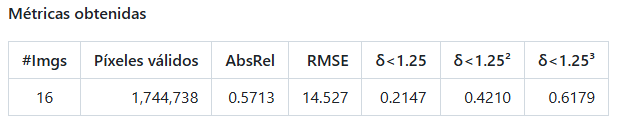

## 7. Conclusiones

El proyecto logró desarrollar un sistema funcional de estimación de profundidad monocular en tiempo real, cumpliendo con el objetivo de integrar técnicas tradicionales de procesamiento digital de imágenes con enfoques de *deep learning*. A través de un estudio inicial de los métodos más utilizados para la detección de profundidad en visión por computador, se identificaron diferentes modelos de repositorios públicos, de los que fueron probados MiDaS, Patch Fusion y Marigold, seleccionando finalmente MiDaS (Intel-ISL) por su disponibilidad en PyTorch y su facilidad de adaptación a entornos de captura y hardware diversos. El sistema implementado se diseñó como una aplicación parametrizable por CLI, capaz de procesar tanto video en tiempo real como lotes de imágenes, lo que demuestra una correcta adaptación y optimización del código base utilizado.

La validación con el dataset KITTI permitió cuantificar el rendimiento del modelo, evidenciando métricas de error relativamente altas. Este resultado sugiere que el preacondicionamiento aplicado a las imágenes captadas (incluyendo normalización fotométrica, realce de bordes, máscaras morfológicas, redimensionado) pudo introducir incertidumbres que afectaron negativamente la precisión. No obstante, este hallazgo es valioso, ya que evidencia la sensibilidad de los modelos de *deep learning* a las transformaciones previas y abre líneas claras de mejora, como la optimización del flujo de preprocesamiento o el ajuste fino del modelo en datos más cercanos a las condiciones reales de captura. El trabajo demuestra la viabilidad de combinar procesamiento clásico y aprendizaje profundo para resolver problemas concretos de visión por computador, así como la importancia de una validación cuidadosa para orientar futuras optimizaciones.


Como recomendación para trabajos futuros, se sugiere realizar entrenamientos y validaciones utilizando otros modelos disponibles en la familia de MiDaS, como DPT_Large y MiDaS_small, dado que en este proyecto se trabajó exclusivamente con DPT_Hybrid. Esta comparación permitiría evaluar si arquitecturas con mayor capacidad o menor complejidad pueden ofrecer un mejor equilibrio entre precisión y velocidad, optimizando así el rendimiento del sistema desarrollado.



## 8. Referencias

1. https://medium.com/@patriciogv/the-state-of-the-art-of-depth-estimation-from-single-images-9e245d51a315

2. https://viso.ai/computer-vision/monocular-depth-estimation/
3. https://www.ipol.im/pub/art/2023/459/?utm_source=doi
4. https://arxiv.org/abs/2501.11841
5. https://arxiv.org/pdf/2104.06456
6. https://github.com/superKabe/Depth-Estimation-on-KITTI